<h1 style="
  font-family: 'Americana XBdCn BT';
  text-shadow: 2px 2px 4px rgba(0,0,0,0.2);
  font-size: 60px;
  font-style: normal;
  background: linear-gradient(to right, #252422, #252422);
  letter-spacing: 3px;
  color: #eb5e28;
  border-radius: 40px;
  text-align: center;
  line-height: 1;
  padding: 20px 10px;
">
  <span>ScalerMart:</span><br>
  <span style="color: #eb5e28;">Data Analytics Case Study</span>
</h1>


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import PowerTransformer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [2]:
df1 = pd.read_csv("Customers.csv",encoding="ISO-8859-1")
df2 = pd.read_csv("Products.csv")
df3 = pd.read_csv("Sales.csv")

In [3]:
# Shapes
print(df1.shape)
print(df1.columns)
print(df2.shape)
print(df2.columns)
print(df3.shape)
print(df3.columns)

(15266, 10)
Index(['CustomerKey', 'Gender', 'Name', 'City', 'State Code', 'State',
       'Zip Code', 'Country', 'Continent', 'Birthday'],
      dtype='object')
(2517, 10)
Index(['ProductKey', 'Product Name', 'Brand', 'Color', 'Unit Cost USD',
       'Unit Price USD', 'SubcategoryKey', 'Subcategory', 'CategoryKey',
       'Category'],
      dtype='object')
(62884, 9)
Index(['Order Number', 'Line Item', 'Order Date', 'Delivery Date',
       'CustomerKey', 'StoreKey', 'ProductKey', 'Quantity', 'Currency Code'],
      dtype='object')


In [4]:
df1.nunique()

CustomerKey    15266
Gender             2
Name           15118
City            8258
State Code       467
State            512
Zip Code        9505
Country            8
Continent          3
Birthday       11270
dtype: int64

In [5]:
df2.nunique()

ProductKey        2517
Product Name      2517
Brand               11
Color               16
Unit Cost USD      480
Unit Price USD     426
SubcategoryKey      32
Subcategory         32
CategoryKey          8
Category             8
dtype: int64

In [6]:
df3.nunique()

Order Number     26326
Line Item            7
Order Date        1641
Delivery Date     1492
CustomerKey      11887
StoreKey            58
ProductKey        2492
Quantity            10
Currency Code        5
dtype: int64

In [7]:
# Merge Customers and Sales
df_merge1 = pd.merge(df3, df1, on="CustomerKey", how="left")

# Merge the above with Products
main_df = pd.merge(df_merge1, df2, on="ProductKey", how="left")

# Check the shape and columns
print(main_df.shape)
print(main_df.columns)
pd.set_option("display.max_columns",None)
main_df.head()

(62884, 27)
Index(['Order Number', 'Line Item', 'Order Date', 'Delivery Date',
       'CustomerKey', 'StoreKey', 'ProductKey', 'Quantity', 'Currency Code',
       'Gender', 'Name', 'City', 'State Code', 'State', 'Zip Code', 'Country',
       'Continent', 'Birthday', 'Product Name', 'Brand', 'Color',
       'Unit Cost USD', 'Unit Price USD', 'SubcategoryKey', 'Subcategory',
       'CategoryKey', 'Category'],
      dtype='object')


,Order Number,Line Item,Order Date,Delivery Date,CustomerKey,StoreKey,ProductKey,Quantity,Currency Code,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday,Product Name,Brand,Color,Unit Cost USD,Unit Price USD,SubcategoryKey,Subcategory,CategoryKey,Category
0,366000,1,1/1/2016,NaN,265598,10,1304,1,CAD,Male,Tyler Vaught,London,ON,Ontario,N5W 5K6,Canada,North America,3/23/1971,Contoso Lens Adapter M450 White,Contoso,White,$31.27,$68.00,406,Cameras & Camcorders Accessories,4,Cameras and camcorders
1,366001,1,1/1/2016,1/13/2016,1269051,0,1048,2,USD,Male,Frank Upchurch,Auberry,CA,California,93602,United States,North America,11/20/1995,A. Datum SLR Camera X136 Silver,A. Datum,Silver,$141.47,$427.00,402,Digital SLR Cameras,4,Cameras and camcorders
2,366001,2,1/1/2016,1/13/2016,1269051,0,2007,1,USD,Male,Frank Upchurch,Auberry,CA,California,93602,United States,North America,11/20/1995,Fabrikam Microwave 1.5CuFt X1100 Black,Fabrikam,Black,$220.64,$665.94,803,Microwaves,8,Home Appliances
3,366002,1,1/1/2016,1/12/2016,266019,0,1106,7,CAD,Female,Joan Roche,Red Deer,AB,Alberta,T4N 2A6,Canada,North America,8/24/1962,Contoso SLR Camera M146 Orange,Contoso,Orange,$148.08,$322.00,402,Digital SLR Cameras,4,Cameras and camcorders
4,366002,2,1/1/2016,1/12/2016,266019,0,373,1,CAD,Female,Joan Roche,Red Deer,AB,Alberta,T4N 2A6,Canada,North America,8/24/1962,Adventure Works Laptop8.9 E0890 White,Adventure Works,White,$166.20,$326.00,301,Laptops,3,Computers


In [8]:
main_df.dtypes

Order Number       int64
Line Item          int64
Order Date        object
Delivery Date     object
CustomerKey        int64
StoreKey           int64
ProductKey         int64
Quantity           int64
Currency Code     object
Gender            object
Name              object
City              object
State Code        object
State             object
Zip Code          object
Country           object
Continent         object
Birthday          object
Product Name      object
Brand             object
Color             object
Unit Cost USD     object
Unit Price USD    object
SubcategoryKey     int64
Subcategory       object
CategoryKey        int64
Category          object
dtype: object

In [9]:
# Columns to convert to datetime
for col in ['Order Date', 'Delivery Date', 'Birthday']:
    main_df[col] = pd.to_datetime(main_df[col], errors='coerce')

# Columns to convert to int
int_cols = ['Order Number', 'Line Item', 'CustomerKey', 'StoreKey', 'ProductKey', 'Quantity', 'SubcategoryKey', 'CategoryKey']
for col in int_cols:
    main_df[col] = main_df[col].astype(int)

# Columns to convert to float after removing $ sign
for col in ['Unit Cost USD', 'Unit Price USD']:
    main_df[col] = main_df[col].replace('[\$,]', '', regex=True).astype(float)

# Verify
print(main_df.dtypes)


Order Number               int64
Line Item                  int64
Order Date        datetime64[ns]
Delivery Date     datetime64[ns]
CustomerKey                int64
StoreKey                   int64
ProductKey                 int64
Quantity                   int64
Currency Code             object
Gender                    object
Name                      object
City                      object
State Code                object
State                     object
Zip Code                  object
Country                   object
Continent                 object
Birthday          datetime64[ns]
Product Name              object
Brand                     object
Color                     object
Unit Cost USD            float64
Unit Price USD           float64
SubcategoryKey             int64
Subcategory               object
CategoryKey                int64
Category                  object
dtype: object


In [10]:
# Step 1: Strip extra spaces and unify case
main_df['State'] = main_df['State'].str.strip().str.title()

# Step 2: Create a mapping for known states/provinces per country (simplified example)
country_state_map = {
    'Canada': ['Ontario', 'Alberta', 'Quebec', 'British Columbia', 'Saskatchewan'],
    'United States': ['California', 'Texas', 'New York', 'Florida', 'Ohio', 'Illinois', 'Michigan'],
    'United Kingdom': ['West Lancashire', 'North Hertfordshire', 'Aberdeenshire', 'North Ayrshire'],
    'Italy': ['Napoli', 'Milano', 'Genova', 'Roma', 'Firenze'],
    'France': ['Mayotte', 'Limousin', "Île-De-France", 'Auvergne'],
    'Germany': ['Freistaat Bayern', 'Hessen', 'Sachsen', 'Sachsen-Anhalt'],
    'Australia': ['New South Wales', 'Western Australia', 'Tasmania', 'Queensland'],
    'Netherlands': ['Zuid-Holland', 'Noord-Holland', 'Overijssel', 'Drenthe']
}

# Step 3: Standardize unknown/missing or non-mapped states as 'Other'
def standardize_state(row):
    country = row['Country']
    state = row['State']
    if country in country_state_map and state in country_state_map[country]:
        return state
    else:
        return 'Other'

main_df['State'] = main_df.apply(standardize_state, axis=1)

# Step 4: Check unique categories after cleaning
print(main_df['State'].unique())


['Ontario' 'California' 'Alberta' 'West Lancashire' 'Other' 'Napoli'
 'Quebec' 'Illinois' 'Texas' 'Aberdeenshire' 'New York'
 'North Hertfordshire' 'Genova' 'Mayotte' 'Milano' 'Freistaat Bayern'
 'Zuid-Holland' 'Ohio' 'Michigan' 'Firenze' 'New South Wales' 'Florida'
 'Auvergne' 'Noord-Holland' 'British Columbia' 'Hessen' 'Limousin'
 'Île-De-France' 'Tasmania' 'Queensland' 'North Ayrshire'
 'Western Australia' 'Sachsen-Anhalt' 'Roma' 'Saskatchewan' 'Drenthe'
 'Overijssel']


In [11]:
# Fill remaining nulls with 'OT' (Other)
main_df['State Code'] = main_df['State Code'].fillna('OT')

# Verify
print(main_df['State Code'].isnull().sum())


0


In [12]:
# Calculate customer age at the time of order
from datetime import datetime

latest_date = datetime(2021, 2, 20)
main_df["Age"] = ((latest_date - pd.to_datetime(main_df["Birthday"])).dt.days // 365)


# Check
main_df[['Order Date', 'Birthday', 'Age']].head()


,Order Date,Birthday,Age
0,2016-01-01,1971-03-23,49
1,2016-01-01,1995-11-20,25
2,2016-01-01,1995-11-20,25
3,2016-01-01,1962-08-24,58
4,2016-01-01,1962-08-24,58


In [13]:
main_df.head()

,Order Number,Line Item,Order Date,Delivery Date,CustomerKey,StoreKey,ProductKey,Quantity,Currency Code,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday,Product Name,Brand,Color,Unit Cost USD,Unit Price USD,SubcategoryKey,Subcategory,CategoryKey,Category,Age
0,366000,1,2016-01-01,NaT,265598,10,1304,1,CAD,Male,Tyler Vaught,London,ON,Ontario,N5W 5K6,Canada,North America,1971-03-23,Contoso Lens Adapter M450 White,Contoso,White,31.27,68.00,406,Cameras & Camcorders Accessories,4,Cameras and camcorders,49
1,366001,1,2016-01-01,2016-01-13,1269051,0,1048,2,USD,Male,Frank Upchurch,Auberry,CA,California,93602,United States,North America,1995-11-20,A. Datum SLR Camera X136 Silver,A. Datum,Silver,141.47,427.00,402,Digital SLR Cameras,4,Cameras and camcorders,25
2,366001,2,2016-01-01,2016-01-13,1269051,0,2007,1,USD,Male,Frank Upchurch,Auberry,CA,California,93602,United States,North America,1995-11-20,Fabrikam Microwave 1.5CuFt X1100 Black,Fabrikam,Black,220.64,665.94,803,Microwaves,8,Home Appliances,25
3,366002,1,2016-01-01,2016-01-12,266019,0,1106,7,CAD,Female,Joan Roche,Red Deer,AB,Alberta,T4N 2A6,Canada,North America,1962-08-24,Contoso SLR Camera M146 Orange,Contoso,Orange,148.08,322.00,402,Digital SLR Cameras,4,Cameras and camcorders,58
4,366002,2,2016-01-01,2016-01-12,266019,0,373,1,CAD,Female,Joan Roche,Red Deer,AB,Alberta,T4N 2A6,Canada,North America,1962-08-24,Adventure Works Laptop8.9 E0890 White,Adventure Works,White,166.20,326.00,301,Laptops,3,Computers,58


In [14]:
main_df['Total_Spend'] = main_df['Quantity'] * main_df['Unit Price USD']

main_df['Total_Spend'] = main_df['Quantity'] * main_df['Unit Price USD']

main_df['Order_Year'] = main_df['Order Date'].dt.year
main_df['Order_Month'] = main_df['Order Date'].dt.month
main_df['Order_Weekday'] = main_df['Order Date'].dt.day_name()

bins = [13, 24, 34, 44, 54, 64, 72]
labels = ['Teen_YoungAdult', 'EarlyCareer', 'MidCareer', 'MatureAdult', 'SeniorProfessional', 'Retired']
main_df['AgeGroup'] = pd.cut(main_df['Age'], bins=bins, labels=labels, include_lowest=True)

# Create absolute and percentage margin columns
main_df["Unit_Margin"] = main_df["Unit Price USD"] - main_df["Unit Cost USD"]
main_df["Unit_Margin%"] = (
    (main_df["Unit_Margin"] / main_df["Unit Cost USD"]) * 100
).round(2)



<h1 style="
  font-family: 'Americana XBdCn BT';
  text-shadow: 2px 2px 4px rgba(0,0,0,0.2);
  font-size: 35px;
  font-style: normal;
  background: linear-gradient(to right, #252422, #252422);
  letter-spacing: 0px;
  color: #eb5e28;
  border-radius: 40px;
  text-align: left;
  line-height: 1;
  padding: 10px 10px;
">
  <span>The story of how 2020 faced a 50% reduction in 2020 starts here.... </span><br>
</h1>


In [15]:
facecolor = "#f2f2f2"
blue = "#252422"
green = "#eb5e28"
fonts = ["Americana XBdCn BT", 'Georgia', 'Times New Roman']

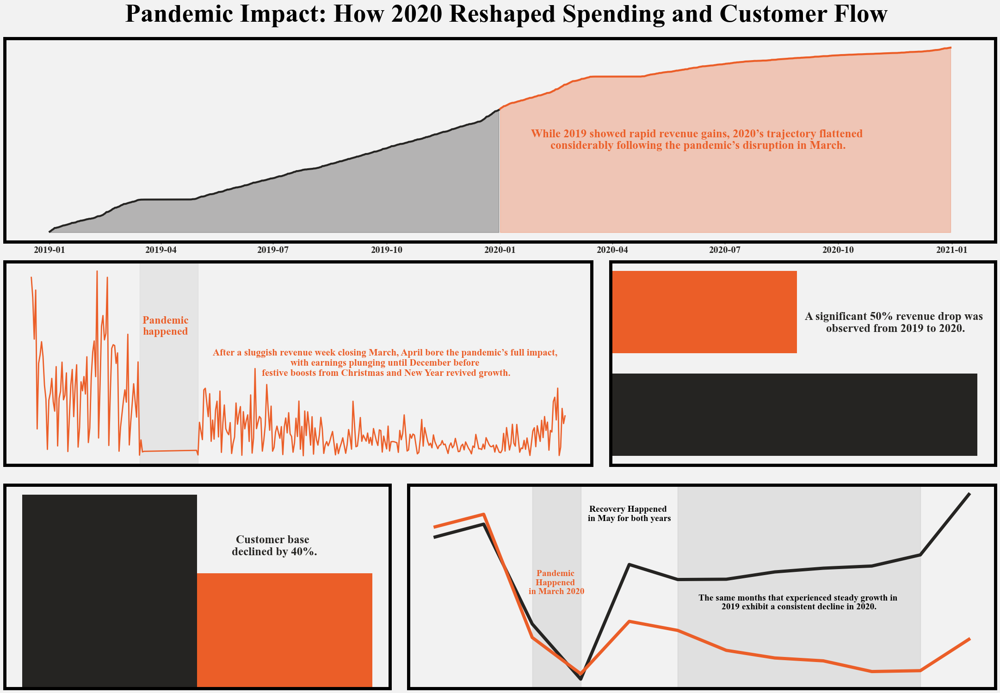

In [16]:
fig = plt.figure(figsize=(22, 15), facecolor=facecolor,dpi=100)
fig.suptitle("Pandemic Impact: How 2020 Reshaped Spending and Customer Flow", x=0.5,ha="center",va="center",font=fonts[2],fontweight="bold",color="black",fontsize=40)
# Top row: cumulative total spending 2019 & 2020
ax3 = plt.subplot2grid((3,5), (0,0), colspan=5)
ts_19_20 = main_df[main_df["Order_Year"].isin([2019,2020])].groupby("Order Date")["Total_Spend"].sum().sort_index().cumsum()
colors_top = {2019: blue, 2020: green}
for year, color in colors_top.items():
    mask = ts_19_20.index.year == year
    if mask.any():
        idx = ts_19_20.index[mask]; vals = ts_19_20.loc[idx].values
        ax3.plot(idx, vals, color=color, linewidth=3); ax3.fill_between(idx, vals, color=color, alpha=0.3)
ax3.set_yticks([]); ax3.tick_params(axis='x', colors=blue, labelsize=15, labelrotation=0)
for label in ax3.get_xticklabels(): label.set_fontname(fonts[2]); label.set_fontweight('bold')
for spine in ax3.spines.values(): spine.set_color("black"); spine.set_linewidth(1)

# Middle row left: 2022 time series
ax1 = plt.subplot2grid((3,5), (1,0), colspan=3)
main_df['Order Date'] = pd.to_datetime(main_df['Order Date'])
ts_2020 = main_df[main_df['Order Date'].dt.year == 2020].groupby('Order Date')['Total_Spend'].sum().sort_index()
ax1.plot(ts_2020.index, ts_2020.values, color=green, linewidth=2)
ax1.axvspan(pd.Timestamp('2020-03-15'), pd.Timestamp('2020-04-24'), color="lightgrey", alpha=0.4)
ax1.text(pd.Timestamp('2020-03-17'), 0.7 * ts_2020.max(), "Pandemic \nhappened", color=green, fontname=fonts[2], fontweight='bold', fontsize=17,va="center")
# ax1.axvspan(pd.Timestamp('2022-03-15'), pd.Timestamp('2022-04-24'), color="lightgrey", alpha=0.4)
ax1.set_xticks([]); ax1.set_yticks([])

# Middle row right: horizontal bar plot 2019 vs 2020
ax2 = plt.subplot2grid((3,5), (1,3), colspan=2)
agg_df = main_df[main_df["Order_Year"].isin([2019, 2020])].groupby("Order_Year")["Total_Spend"].sum().reset_index().sort_values("Order_Year")
colors_hbar = agg_df["Order_Year"].map({2019: blue, 2020: green})
ax2.text(0.74, 0.7, "A significant 50% revenue drop was \nobserved from 2019 to 2020.", color=blue, fontname=fonts[2],
         fontweight='bold', fontsize=18, ha="center", va="center", transform=ax2.transAxes)
ax2.barh(agg_df["Order_Year"], agg_df["Total_Spend"], color=colors_hbar)
ax2.set_xticks([]); ax2.set_yticks([])

# Bottom row left: empty spines
ax4 = plt.subplot2grid((3,5), (2,0), colspan=2)
ax4.set_facecolor(facecolor)
colors = {2019: blue, 2020: green}
customer_counts = main_df[main_df["Order_Year"].isin([2019, 2020])]
customer_counts = customer_counts.groupby("Order_Year")["Name"].nunique().reset_index(name="Customer_Count")
for i, row in customer_counts.iterrows():
    ax4.bar(row["Order_Year"], row["Customer_Count"], color=colors[row["Order_Year"]],width=1)
ax4.text(0.7, 0.7, "Customer base \ndeclined by 40%.", color=blue, fontname=fonts[2],
         fontweight='bold', fontsize=18, ha="center", va="center", transform=ax4.transAxes)
ax4.set_xticks([]); ax4.set_yticks([])

# Bottom row right: monthly total spending 2019 vs 2020
ax5 = plt.subplot2grid((3,5), (2,2), colspan=3)
filtered = main_df[main_df["Order_Year"].isin([2019, 2020])].groupby(["Order_Year","Order_Month"])["Total_Spend"].sum().reset_index()
for year, color in zip([2019,2020],[blue,green]):
    subset = filtered[filtered["Order_Year"]==year]
    ax5.plot(subset["Order_Month"], subset["Total_Spend"], linewidth=5, color=color)
ax5.axvspan(3,4, color="#444", alpha=0.1); ax5.axvspan(6,11,color="#444", alpha=0.1)
ax5.set_xticks([]); ax5.set_yticks([])
ax5.text(3.5, 1.1*filtered["Total_Spend"].max()/2,"Pandemic \nHappened \nin March 2020", color=green, fontname=fonts[2], fontweight='bold', fontsize=14, ha="center", va="center")
ax5.text(5, 1.8*filtered["Total_Spend"].max()/2,"Recovery Happened \nin May for both years", color="black", fontname=fonts[2], fontweight='bold', fontsize=14, ha="center", va="center")
ax5.text(8.5, 0.9*filtered["Total_Spend"].max()/2,"The same months that experienced steady growth in \n2019 exhibit a consistent decline in 2020.", color="black", fontname=fonts[2], fontweight='bold', fontsize=14, ha="center", va="center")
for ax in [ax1, ax2, ax3, ax4, ax5]: ax.patch.set_facecolor(facecolor)
for ax in [ax1,ax2,ax3,ax4,ax5]: 
    for spine in ax.spines.values(): spine.set_color("black"); spine.set_linewidth(5)
ax3.text(0.7,0.5,"While 2019 showed rapid revenue gains, 2020’s trajectory flattened \nconsiderably following the pandemic’s disruption in March."
         ,color=green, fontname=fonts[2],fontweight='bold', fontsize=18, ha="center", va="center", transform=ax3.transAxes)
ax1.text(0.65,0.5,"After a sluggish revenue week closing March, April bore the pandemic’s full impact, \nwith earnings plunging until December before \nfestive boosts from Christmas and New Year revived growth."
         ,color=green, fontname=fonts[2],fontweight='bold', fontsize=15, ha="center", va="center", transform=ax1.transAxes)
ax2.text(0.74, 0.7, "", color=blue, fontname=fonts[2],
         fontweight='bold', fontsize=18, ha="center", va="center", transform=ax2.transAxes)
plt.tight_layout()
plt.show()


<h1 style="
  font-family: 'Americana XBdCn BT';
  text-shadow: 2px 2px 4px rgba(0,0,0,0.2);
  font-size: 35px;
  font-style: normal;
  background: linear-gradient(to right, #252422, #252422);
  letter-spacing: 0px;
  color: #eb5e28;
  border-radius: 40px;
  text-align: left;
  line-height: 1;
  padding: 10px 10px;
">
  <span>The story of Categories and Subcategories..... </span><br>
</h1>


In [17]:
def plot_category(main_df, category_name, ax):
    df_cat = main_df[main_df["Category"] == category_name]
    df_19_20 = df_cat[df_cat["Order_Year"].isin([2019, 2020])] 
    agg_sub = df_19_20.groupby(["Order_Year", "Subcategory"])["Total_Spend"].sum().reset_index()
    subcategory_order = agg_sub[agg_sub["Order_Year"] == 2019].sort_values("Total_Spend", ascending=False)["Subcategory"].tolist()
    pivot_df = agg_sub.pivot(index="Subcategory", columns="Order_Year", values="Total_Spend").reindex(subcategory_order)
    total_2019 = pivot_df[2019].sum()
    total_2020 = pivot_df[2020].sum()
    diff_percent = ((total_2020 - total_2019) / total_2019) * 100
    bar_width = 0.35
    indices = np.arange(len(subcategory_order)) 
    ax.bar(indices - bar_width/2, pivot_df[2019], width=bar_width, color=blue, alpha=1, edgecolor=green)
    ax.bar(indices + bar_width/2, pivot_df[2020], width=bar_width, color=green, alpha=1,edgecolor=blue)
    ax.set_xticks(indices)
    ax.set_xticklabels(subcategory_order, ha='center')
    for label in ax.get_xticklabels():
        label.set_fontname(fonts[2]);label.set_fontweight('semibold');label.set_fontsize(13)
    ax.text(0.7, 0.9, f"Category: {category_name}", color="black", fontname=fonts[2],
            fontweight="bold", fontsize=20, transform=ax.transAxes, ha="center", va="center")
    ax.text(0.7, 0.8, f"2019's Revenue: $ {total_2019/1000:.0f}k", fontname=fonts[2], fontsize=16,
            transform=ax.transAxes, ha="center", va="center", color=blue, fontweight="bold")
    ax.text(0.7, 0.7, f"2020's Revenue: $ {total_2020/1000:.0f}k", fontname=fonts[2], fontsize=16,
            transform=ax.transAxes, ha="center", va="center", color=green, fontweight="bold")
    ax.text(0.7, 0.6, f"Diff: {diff_percent:.1f}%", fontname=fonts[2], fontsize=16,
        transform=ax.transAxes, ha="center", va="center", color="black",fontweight="bold")
    max_height = pivot_df.max().max() if not pivot_df.empty else 0
    offset = max_height * 0.02 if max_height > 0 else 1
    for i, sub in enumerate(subcategory_order):
        val_2019 = pivot_df.loc[sub, 2019] if (2019 in pivot_df.columns and sub in pivot_df.index) else 0
        val_2020 = pivot_df.loc[sub, 2020] if (2020 in pivot_df.columns and sub in pivot_df.index) else 0
        if val_2019 and not np.isnan(val_2019):
            diff_sub_pct = (val_2019 - val_2020) / val_2019 * 100
            ax.text(indices[i] + bar_width/2, val_2020 + offset, f"- {diff_sub_pct:.1f}%", color=green,
                    fontname=fonts[2], fontsize=13, ha='center', va='bottom',fontweight="bold")
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_color("black")


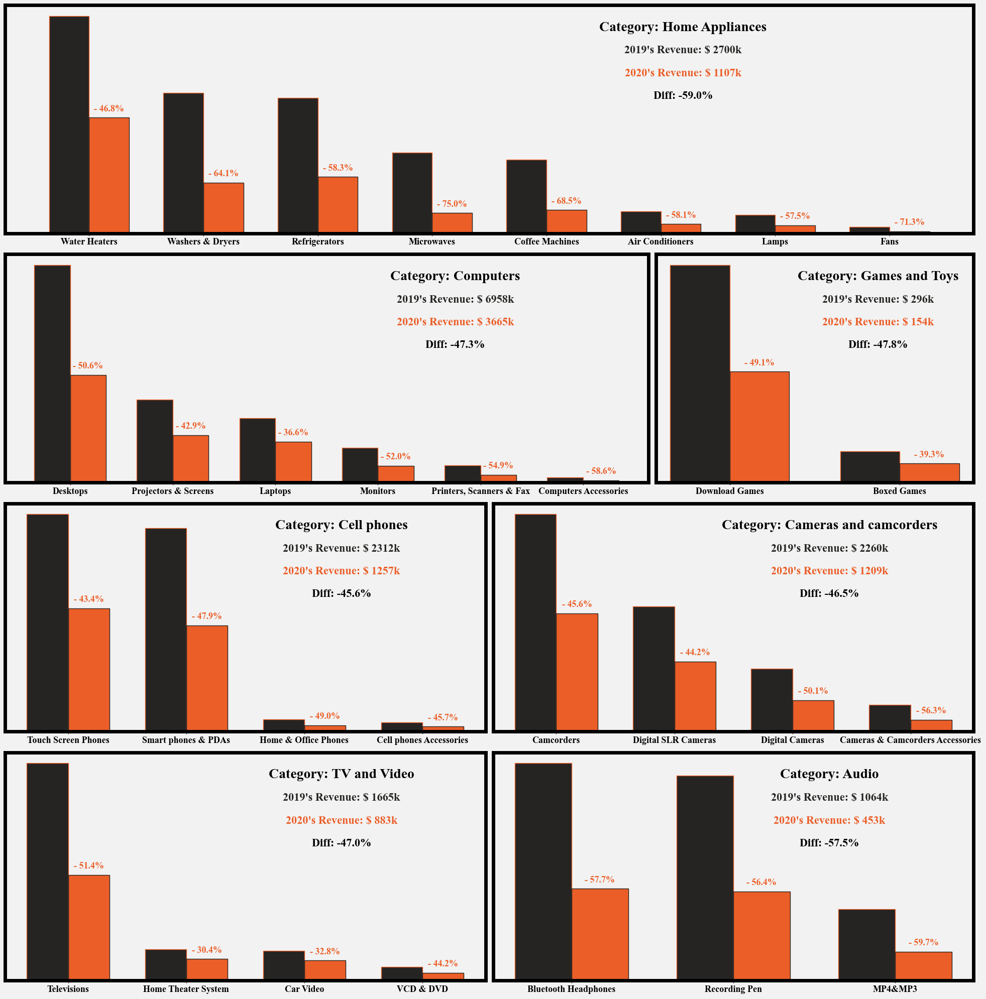

In [18]:
fig = plt.figure(figsize=(20, 20), facecolor=facecolor)
ax_home = plt.subplot2grid((4,6), (0,0), colspan=6)
plot_category(main_df,"Home Appliances",ax_home)
ax_computers = plt.subplot2grid((4,6), (1,0), colspan=4)
plot_category(main_df,"Computers",ax_computers)
ax_games = plt.subplot2grid((4,6), (1,4), colspan=2)
plot_category(main_df,'Games and Toys',ax_games)
ax_cell = plt.subplot2grid((4,6), (2,0), colspan=3)
plot_category(main_df,'Cell phones',ax_cell)
ax_cameras = plt.subplot2grid((4,6), (2,3), colspan=3)
plot_category(main_df,'Cameras and camcorders',ax_cameras)
ax_tv = plt.subplot2grid((4,6), (3,0), colspan=3)
plot_category(main_df,'TV and Video',ax_tv)
ax_audio = plt.subplot2grid((4,6), (3,3), colspan=3)
plot_category(main_df,'Audio',ax_audio)
# all_axes = [ax_home, ax_computers, ax_games, ax_cell, ax_cameras,ax_tv, ax_audio, ax_music, ax_empty]
all_axes = [ax_home, ax_computers, ax_games, ax_cell, ax_cameras,ax_tv, ax_audio]
for ax in all_axes:
    ax.patch.set_facecolor(facecolor);ax.set_yticks([]);ax.set_xlabel('');ax.set_ylabel('')
    for spine in ax.spines.values():
        spine.set_color('black')
        spine.set_linewidth(5)
plt.tight_layout()
plt.show()


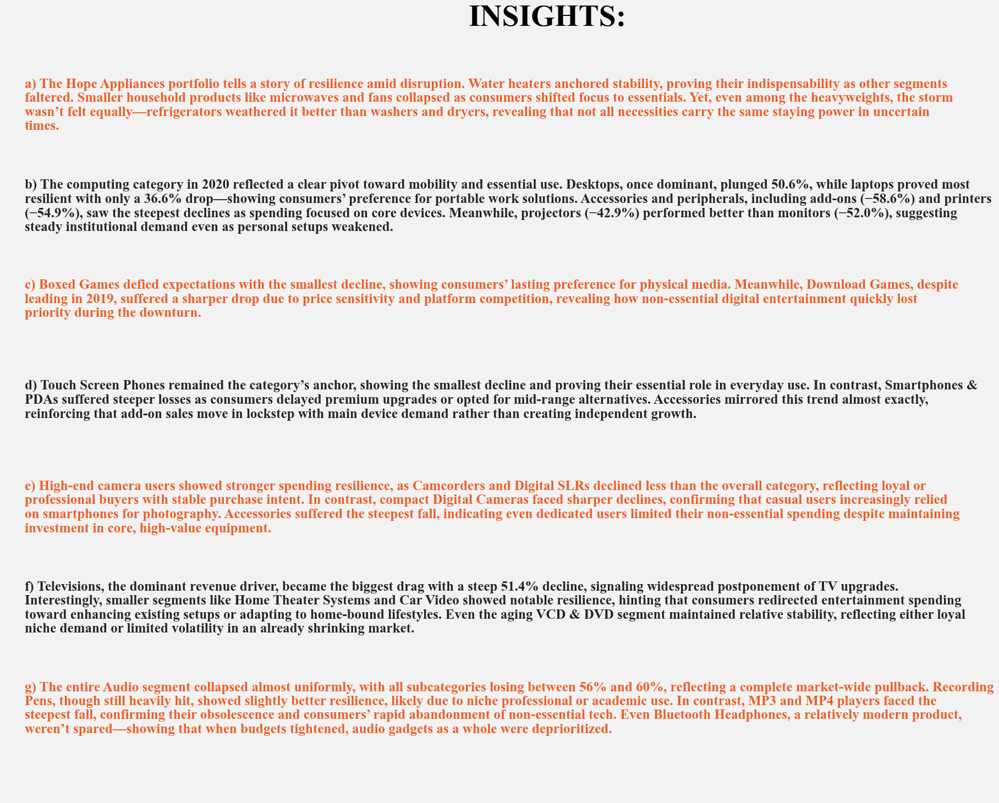

In [19]:
import textwrap

fig, ax = plt.subplots(1, 1, figsize=(20, 15), facecolor=facecolor)

# Title aligned left
fig.suptitle("INSIGHTS:",
              y=0.97, ha='center',
             font=fonts[2], fontweight="bold", color="black", fontsize=40)

ax.set_facecolor(facecolor)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel("")
ax.set_ylabel("")

for spine in ax.spines.values():
    spine.set_visible(False)

insights = [
    "The Hope Appliances portfolio tells a story of resilience amid disruption. Water heaters anchored stability, proving their indispensability as other segments faltered. Smaller household products like microwaves and fans collapsed as consumers shifted focus to essentials. Yet, even among the heavyweights, the storm wasn’t felt equally—refrigerators weathered it better than washers and dryers, revealing that not all necessities carry the same staying power in uncertain times.",
    "The computing category in 2020 reflected a clear pivot toward mobility and essential use. Desktops, once dominant, plunged 50.6%, while laptops proved most resilient with only a 36.6% drop—showing consumers’ preference for portable work solutions. Accessories and peripherals, including add-ons (−58.6%) and printers (−54.9%), saw the steepest declines as spending focused on core devices. Meanwhile, projectors (−42.9%) performed better than monitors (−52.0%), suggesting steady institutional demand even as personal setups weakened.",
    "Boxed Games defied expectations with the smallest decline, showing consumers’ lasting preference for physical media. Meanwhile, Download Games, despite leading in 2019, suffered a sharper drop due to price sensitivity and platform competition, revealing how non-essential digital entertainment quickly lost priority during the downturn.",
    "Touch Screen Phones remained the category’s anchor, showing the smallest decline and proving their essential role in everyday use. In contrast, Smartphones & PDAs suffered steeper losses as consumers delayed premium upgrades or opted for mid-range alternatives. Accessories mirrored this trend almost exactly, reinforcing that add-on sales move in lockstep with main device demand rather than creating independent growth.",
    "High-end camera users showed stronger spending resilience, as Camcorders and Digital SLRs declined less than the overall category, reflecting loyal or professional buyers with stable purchase intent. In contrast, compact Digital Cameras faced sharper declines, confirming that casual users increasingly relied on smartphones for photography. Accessories suffered the steepest fall, indicating even dedicated users limited their non-essential spending despite maintaining investment in core, high-value equipment.",
    "Televisions, the dominant revenue driver, became the biggest drag with a steep 51.4% decline, signaling widespread postponement of TV upgrades. Interestingly, smaller segments like Home Theater Systems and Car Video showed notable resilience, hinting that consumers redirected entertainment spending toward enhancing existing setups or adapting to home-bound lifestyles. Even the aging VCD & DVD segment maintained relative stability, reflecting either loyal niche demand or limited volatility in an already shrinking market.",
    "The entire Audio segment collapsed almost uniformly, with all subcategories losing between 56% and 60%, reflecting a complete market-wide pullback. Recording Pens, though still heavily hit, showed slightly better resilience, likely due to niche professional or academic use. In contrast, MP3 and MP4 players faced the steepest fall, confirming their obsolescence and consumers’ rapid abandonment of non-essential tech. Even Bluetooth Headphones, a relatively modern product, weren’t spared—showing that when budgets tightened, audio gadgets as a whole were deprioritized."
]

colors = [green, blue] * 4
y_positions = [0.93 - i * 0.13 for i in range(len(insights))]

for i, (text, y) in enumerate(zip(insights, y_positions)):
    wrapped_text = textwrap.fill(f"{chr(97+i)}) {text}", width=160)
    ax.text(0.02, y, wrapped_text,
            color=colors[i % 2], fontsize=18, fontweight="bold",
            font=fonts[2], ha='left', va='top')


plt.tight_layout()
plt.show()


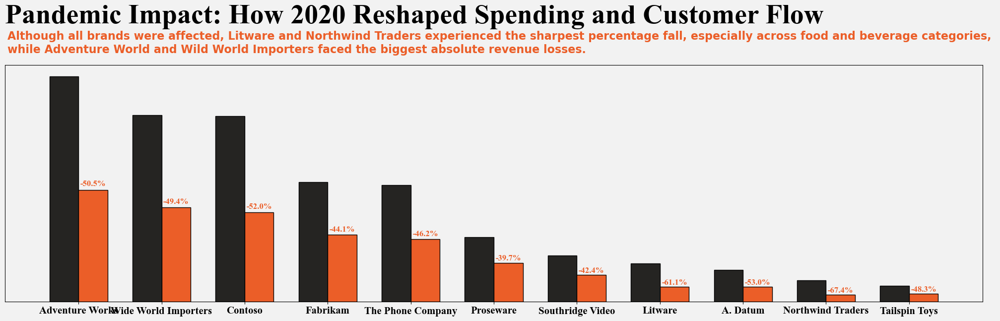

In [20]:
brands_order = ['Adventure Works', 'Wide World Importers','Contoso', 'Fabrikam', 'The Phone Company',
                'Proseware','Southridge Video', 'Litware', 'A. Datum', 'Northwind Traders','Tailspin Toys']
df_19_20 = main_df[main_df["Order_Year"].isin([2019, 2020])]
agg_brand = df_19_20.groupby(["Order_Year","Brand"])["Total_Spend"].sum().reset_index()
pivot_df = agg_brand.pivot(index="Brand", columns="Order_Year", values="Total_Spend").reindex(brands_order)
fig, ax = plt.subplots(figsize=(20, 6),facecolor=facecolor)
ax.patch.set_color(facecolor)
fig.suptitle("Pandemic Impact: How 2020 Reshaped Spending and Customer Flow", x=0.42,va="center",font=fonts[2],y=1.03,
             fontweight="bold",color="black",fontsize=40)
fig.text(0.01, 0.91,"Although all brands were affected, Litware and Northwind Traders experienced the sharpest percentage fall, especially across food and beverage categories, \nwhile Adventure World and Wild World Importers faced the biggest absolute revenue losses.",
         color=green, fontsize=16, fontweight="bold")
bar_width = 0.35
indices = np.arange(len(brands_order))
ax.bar(indices - bar_width/2, pivot_df[2019], width=bar_width, color=blue, edgecolor="black")
ax.bar(indices + bar_width/2, pivot_df[2020], width=bar_width, color=green, edgecolor="black")
for i, brand in enumerate(brands_order):
    val_2019 = pivot_df.loc[brand, 2019]
    val_2020 = pivot_df.loc[brand, 2020]
    diff_pct = (val_2020 - val_2019) / val_2019 * 100
    ax.text(indices[i] + bar_width/2, val_2020 + val_2020*0.02, f"{diff_pct:+.1f}%", 
            ha='center', va='bottom', fontsize=12, fontweight='bold', fontname=fonts[2], color=green)
ax.set_xticks(indices);ax.set_xticklabels(brands_order, fontname=fonts[2], fontweight='bold', fontsize=15);ax.set_yticks([])
for spine in ax.spines.values():
    spine.set_color("black")
plt.tight_layout()
plt.show()


In [21]:
def plot_category_shift(category, title):
    df = main_df[main_df["Category"] == category]

    fig = plt.figure(figsize=(20,6), facecolor=facecolor, dpi=100)
    fig.suptitle(f"From Monthly Category Flow to Yearly Subcategory Shift of {category}",
                 color="black", fontname=fonts[2], fontweight="bold", fontsize=40, y=1.06, ha='center')

    fig.text(0.5, 0.9, title, color=green, fontsize=16, fontweight="regular", ha='center')

    ax1 = plt.subplot2grid((1,5), (0,0), colspan=2)
    ax1.patch.set_facecolor(facecolor)

    for year, color in [(2019, blue), (2020, green)]:
        yearly_data = df[df["Order_Year"] == year].groupby("Order_Month")["Quantity"].sum().sort_index()
        ax1.plot(yearly_data.index, yearly_data.values, label=str(year), color=color, linewidth=1.5, marker="o")
        for x, y_val in zip(yearly_data.index, yearly_data.values):
            ax1.text(x, y_val+0.5, f"{y_val:.0f}", color=color, fontname=fonts[2], fontweight='bold', fontsize=13, ha='center', va='bottom')

    ax1.text(0.5, 0.9, f"Category: {category}", color="black", fontname=fonts[2],
             fontweight="bold", fontsize=24, transform=ax1.transAxes, ha="center", va="center")
    ax1.set_xticks(range(1,13))
    ax1.set_xticklabels(["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"],
                        fontname=fonts[2], fontweight='bold', fontsize=15)
    ax1.set_yticks([]); ax1.legend().remove()

    ax2 = plt.subplot2grid((1,5), (0,2), colspan=3)
    ax2.patch.set_facecolor(facecolor)

    subcat_pivot = df.pivot_table(
        index="Subcategory",
        columns="Order_Year",
        values="Quantity",
        aggfunc="sum",
        fill_value=0
    ).rename(columns={2019:"Qty_2019", 2020:"Qty_2020"}).reset_index()

    subcat_pivot["Diff"] = subcat_pivot["Qty_2020"] - subcat_pivot["Qty_2019"]
    y = range(len(subcat_pivot))

    for i in y:
        ax2.barh(i, subcat_pivot.loc[i, "Qty_2020"], color=green, height=0.7)
        ax2.barh(i, subcat_pivot.loc[i, "Qty_2019"], color=blue, height=0.3)
        ax2.annotate(
            f"{subcat_pivot.loc[i, 'Diff']:+}",
            xy=(subcat_pivot.loc[i, "Qty_2019"], i), xytext=(5,0), textcoords='offset points',
            va="center", ha="left", color="w", fontsize=16, font=fonts[0], fontweight='bold',
            bbox=dict(
                boxstyle='round4', pad=0.4,
                color=blue if subcat_pivot.loc[i, "Diff"] >= 0 else green, alpha=0.8
            )
        )

    ax2.yaxis.tick_right()
    ax2.invert_xaxis()
    ax2.set_yticks(y)
    ax2.set_yticklabels(subcat_pivot["Subcategory"], fontname=fonts[2], fontweight='bold', fontsize=15)
    ax2.set_xticks([]); ax2.set_xlabel(""); ax2.set_ylabel("")

    total_diff = subcat_pivot["Qty_2020"].sum() - subcat_pivot["Qty_2019"].sum()
    ax2.text(0.2, 0.9, f"Shift in Quantity: {total_diff:+,}", transform=ax2.transAxes, color="black",
             fontsize=24, fontname=fonts[2], fontweight="bold", ha="center", va="center")

    for ax in [ax1, ax2]:
        for spine in ax.spines.values():
            spine.set_color("black")
            spine.set_linewidth(4)

    plt.tight_layout()
    plt.show()


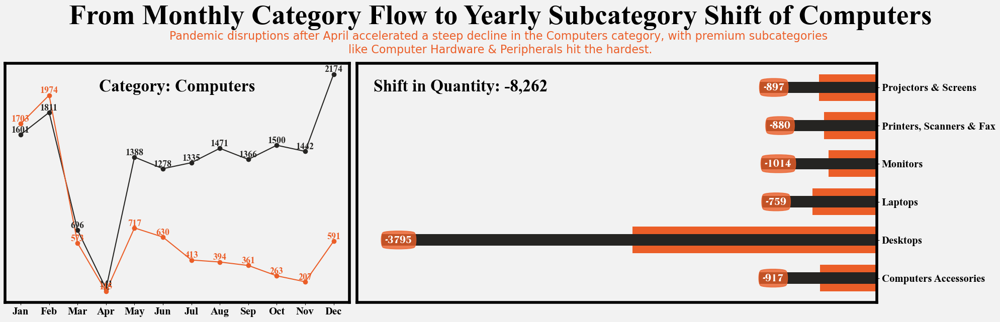

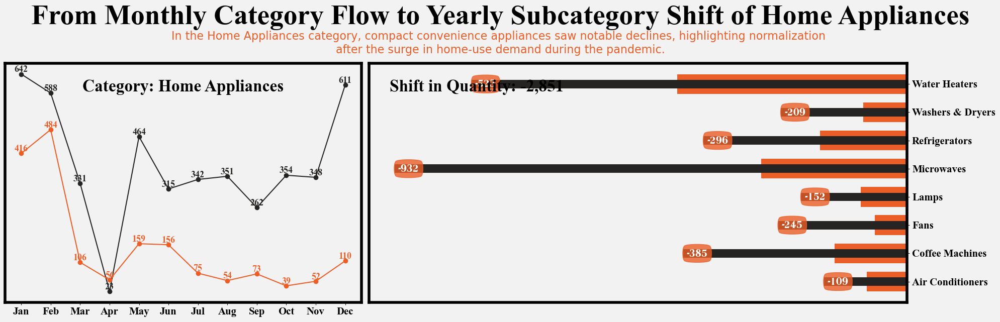

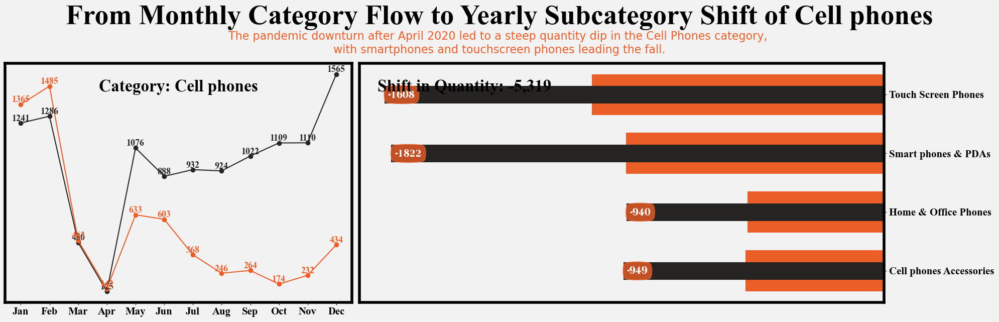

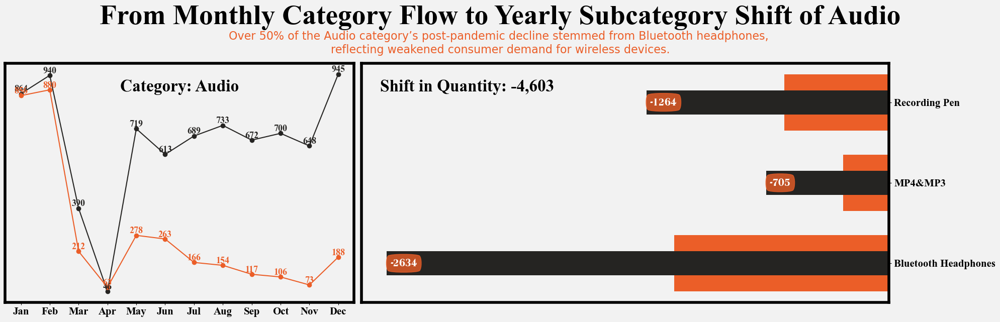

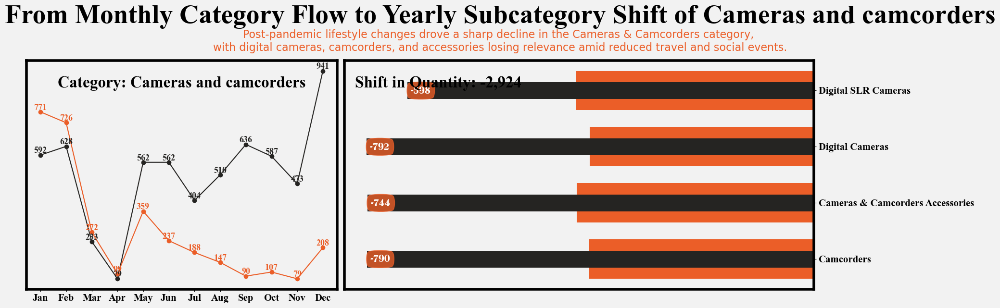

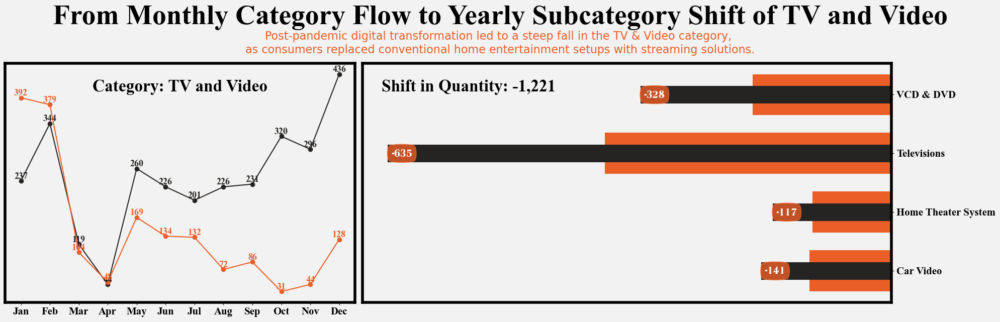

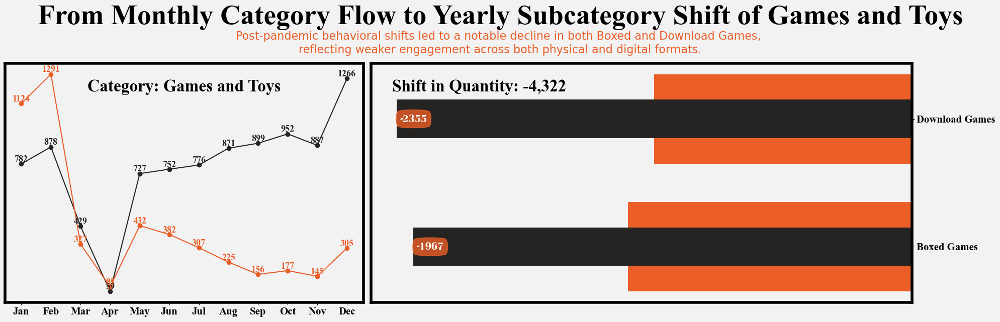

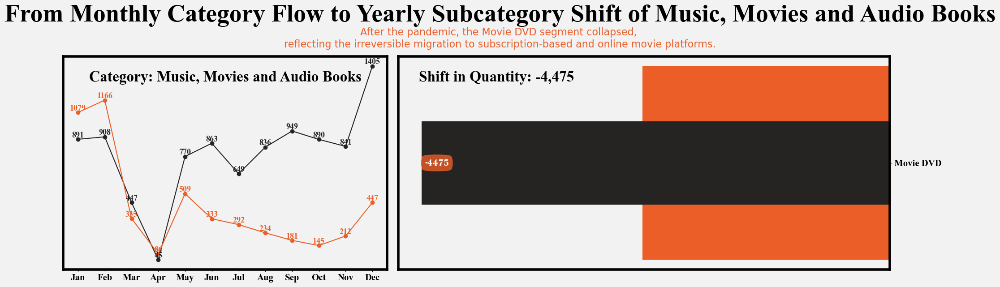

In [22]:
titles = [
    "Pandemic disruptions after April accelerated a steep decline in the Computers category, with premium subcategories \nlike Computer Hardware & Peripherals hit the hardest.",
    "In the Home Appliances category, compact convenience appliances saw notable declines, highlighting normalization \nafter the surge in home-use demand during the pandemic.",
    "The pandemic downturn after April 2020 led to a steep quantity dip in the Cell Phones category, \nwith smartphones and touchscreen phones leading the fall.",
    "Over 50% of the Audio category’s post-pandemic decline stemmed from Bluetooth headphones, \nreflecting weakened consumer demand for wireless devices.",
    "Post-pandemic lifestyle changes drove a sharp decline in the Cameras & Camcorders category, \nwith digital cameras, camcorders, and accessories losing relevance amid reduced travel and social events.",
    "Post-pandemic digital transformation led to a steep fall in the TV & Video category, \nas consumers replaced conventional home entertainment setups with streaming solutions.",
    "Post-pandemic behavioral shifts led to a notable decline in both Boxed and Download Games, \nreflecting weaker engagement across both physical and digital formats.",
    "After the pandemic, the Movie DVD segment collapsed, \nreflecting the irreversible migration to subscription-based and online movie platforms."
]
cols = ['Computers', 'Home Appliances', 'Cell phones', 'Audio','Cameras and camcorders',
       'TV and Video','Games and Toys','Music, Movies and Audio Books']
for idx, cat in enumerate(cols):
    plot_category_shift(cat, titles[idx])

<h1 style="
  font-family: 'Americana XBdCn BT';
  text-shadow: 2px 2px 4px rgba(0,0,0,0.2);
  font-size: 35px;
  font-style: normal;
  background: linear-gradient(to right, #252422, #252422);
  letter-spacing: 0px;
  color: #eb5e28;
  border-radius: 40px;
  text-align: left;
  line-height: 1;
  padding: 10px 10px;
">
  <span>The story of WHO stayed and WHO left.... </span><br>
</h1>


In [23]:
customer_presence = (main_df.groupby(["Name", "Order_Year"]).size().unstack(fill_value=0))
customer_presence = customer_presence.map(lambda x: "Present" if x > 0 else "Absent")
def churn_status(df):
    results = []
    years = sorted(df.columns)
    for i in range(1, len(years)):
        prev, curr = years[i-1], years[i]
        temp = df[[prev, curr]].copy()
        temp["Status"] = temp.apply(
            lambda x: (
                "Retained" if x[prev] == "Present" and x[curr] == "Present"
                else "Churned" if x[prev] == "Present" and x[curr] == "Absent"
                else "New" if x[prev] == "Absent" and x[curr] == "Present"
                else "Inactive"
            ),
            axis=1
        )
        temp["From_Year"], temp["To_Year"] = prev, curr
        results.append(temp[["From_Year", "To_Year", "Status"]])
    return pd.concat(results, axis=0)

churn_df = churn_status(customer_presence)
churn_df.reset_index(inplace=True)
churn_summary = (churn_df.groupby(["From_Year", "To_Year", "Status"]).size().unstack(fill_value=0))
churn_summary

,Status,Churned,Inactive,New,Retained
From_Year,To_Year,,,,
2016,2017,2020,6864,2363,536
2017,2018,1859,5175,3709,1040
2018,2019,2510,2801,4233,2239
2019,2020,4601,3328,1983,1871
2020,2021,3694,7600,329,160


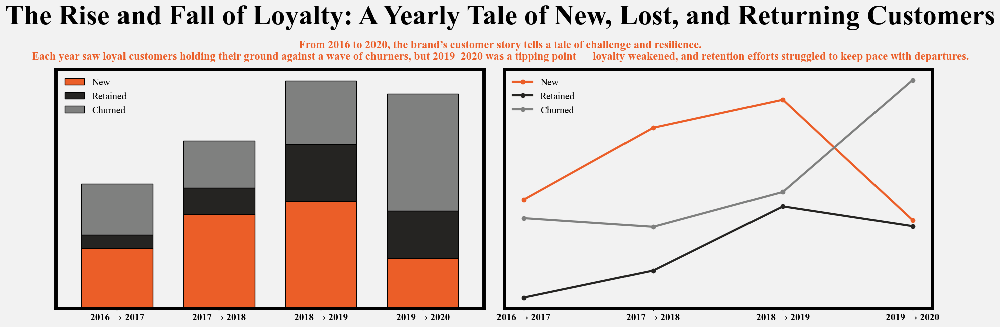

In [24]:
filtered_churn = churn_summary[["New", "Retained", "Churned"]].copy()
filtered_churn = filtered_churn.iloc[:-1]   # keep through 2019->2020 as requested
year_labels = [f"{i[0]} → {i[1]}" for i in filtered_churn.index]
blue = "#252422"
green = "#eb5e28"
grey = "#7f807f"
bar_colors = [green, blue, grey]  # order matches filtered_churn columns: New, Retained, Churned
line_colors = {"New": green, "Retained": blue, "Churned": grey}

fig = plt.figure(figsize=(18, 6), facecolor=facecolor)
fig.suptitle(f"The Rise and Fall of Loyalty: A Yearly Tale of New, Lost, and Returning Customers",
             color="black", fontname=fonts[2], fontweight="bold", fontsize=40,y=1.04,ha="center",va="center")
title = (
    "From 2016 to 2020, the brand’s customer story tells a tale of challenge and resilience.\n"
    "Each year saw loyal customers holding their ground against a wave of churners, but 2019–2020 was a tipping point — "
    "loyalty weakened, and retention efforts struggled to keep pace with departures."
)

fig.text(0.5, 0.9, title,color=green,fontsize=16,fontweight="bold",ha='center',fontfamily=fonts[2])

ax1 = plt.subplot2grid((1, 2), (0, 0))
ax1.patch.set_facecolor(facecolor)
filtered_churn.plot(kind="bar", stacked=True, ax=ax1, color=bar_colors, edgecolor="black", width=0.7)

ax2 = plt.subplot2grid((1, 2), (0, 1))
ax2.patch.set_facecolor(facecolor)
for col in filtered_churn.columns:
    ax2.plot(range(len(filtered_churn)), filtered_churn[col].values,marker="o", linewidth=3, label=col, color=line_colors[col])

for ax in (ax1, ax2):
    ax.set_xticks(range(len(year_labels)));ax.set_xticklabels(year_labels, fontname=fonts[2], fontsize=14, rotation=0,fontweight="bold")  
    ax.set_yticks([]);ax.set_xlabel("");ax.set_ylabel("") ;ax.grid(False)
    for spine in ax.spines.values():
        spine.set_color("black");spine.set_linewidth(5)
    ax.patch.set_facecolor(facecolor)
ax1.legend(title="", frameon=False, prop={"family": fonts[2], "size": 14});ax2.legend(title="", frameon=False, prop={"family": fonts[2], "size": 14})

plt.tight_layout()
plt.show()


In [25]:
years = sorted(main_df["Order_Year"].unique())
revenue_summary = []

for i in range(1, len(years)):
    prev_year, curr_year = years[i-1], years[i]
    prev_df = main_df[main_df["Order_Year"] == prev_year]
    curr_df = main_df[main_df["Order_Year"] == curr_year]
    
    prev_customers = set(prev_df["CustomerKey"])
    curr_customers = set(curr_df["CustomerKey"])
    
    churned_cust = prev_customers - curr_customers 
    retained_cust = prev_customers & curr_customers 
    new_cust = curr_customers - prev_customers
    
    prev_total = prev_df["Total_Spend"].sum()
    curr_total = curr_df["Total_Spend"].sum()
    
    churned_rev = prev_df[prev_df["CustomerKey"].isin(churned_cust)]["Total_Spend"].sum()
    retained_rev = curr_df[curr_df["CustomerKey"].isin(retained_cust)]["Total_Spend"].sum()
    new_rev = curr_df[curr_df["CustomerKey"].isin(new_cust)]["Total_Spend"].sum()
    
    revenue_summary.append({
        "From_Year": prev_year,
        "To_Year": curr_year,
        "Prev_Total_Revenue": prev_total,
        "Curr_Total_Revenue": curr_total,
        "New_Revenue": new_rev,
        "Retained_Revenue": retained_rev,
        "Churned_Revenue": churned_rev,
        "Churned_%_of_Prev": (churned_rev / prev_total) * 100 if prev_total > 0 else 0,
        "Retained_%_of_Curr": (retained_rev / curr_total) * 100 if curr_total > 0 else 0,
        "New_%_of_Curr": (new_rev / curr_total) * 100 if curr_total > 0 else 0
    })

rev_df_fixed = pd.DataFrame(revenue_summary)
rev_df_fixed


,From_Year,To_Year,Prev_Total_Revenue,Curr_Total_Revenue,New_Revenue,Retained_Revenue,Churned_Revenue,Churned_%_of_Prev,Retained_%_of_Curr,New_%_of_Curr
0,2016,2017,6946793.56,7421422.27,5990386.77,1431035.50,5492793.37,79.069477,19.282497,80.717503
1,2017,2018,7421422.27,12788960.66,9894952.55,2894008.11,4828098.82,65.056247,22.628955,77.371045
2,2018,2019,12788960.66,18264382.48,11642031.71,6622350.77,6832905.74,53.428155,36.258279,63.741721
3,2019,2020,18264382.48,9294632.14,4639801.50,4654830.64,12844589.62,70.325890,50.080848,49.919152
4,2020,2021,9294632.14,1039288.48,736216.08,303072.40,8795048.74,94.625033,29.161528,70.838472


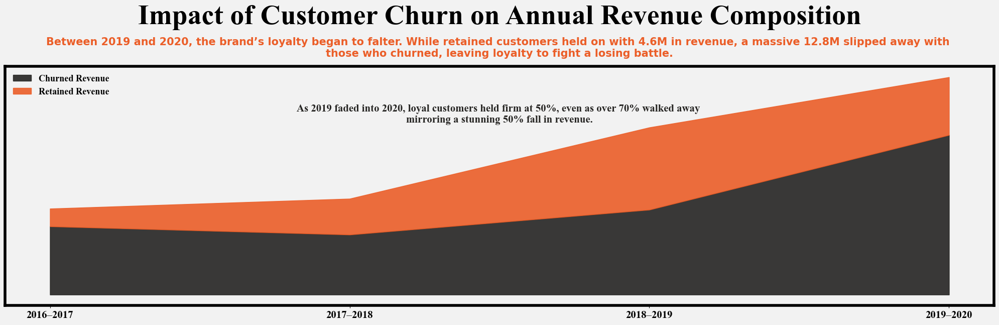

In [26]:
rev_df_filtered = rev_df_fixed[rev_df_fixed["To_Year"] <= 2020].copy()
rev_df_filtered["Year_Range"] = (rev_df_filtered["From_Year"].astype(str) + "–" + rev_df_filtered["To_Year"].astype(str))
fig = plt.figure(figsize=(20,6), facecolor=facecolor)
ax = plt.subplot2grid((1, 1), (0, 0))
ax.patch.set_facecolor(facecolor)
fig.suptitle("Impact of Customer Churn on Annual Revenue Composition",y=1.03, x=0.5,ha="center",va="center",font=fonts[2],fontweight="bold",color="black",fontsize=40)
fig.text(0.5, 0.9,"Between 2019 and 2020, the brand’s loyalty began to falter. While retained customers held on with 4.6M in revenue, a massive 12.8M slipped away with \nthose who churned, leaving loyalty to fight a losing battle.", 
         color=green, fontsize=15, fontweight="bold", ha='center')
ax.fill_between(rev_df_filtered["Year_Range"],0,rev_df_filtered["Churned_Revenue"],color=blue, alpha=0.9, label="Churned Revenue")
ax.fill_between(rev_df_filtered["Year_Range"],rev_df_filtered["Churned_Revenue"],
    rev_df_filtered["Churned_Revenue"] + rev_df_filtered["Retained_Revenue"],color=green, alpha=0.9, label="Retained Revenue")

for spine in ax.spines.values():
    spine.set_color("black");spine.set_linewidth(4)
ax.set_xticks(range(len(rev_df_filtered)));ax.set_xticklabels(rev_df_filtered["Year_Range"],fontfamily=fonts[2],fontweight="bold",color="black",fontsize=15)
ax.set_yticks([]);ax.set_xlabel("");ax.set_ylabel("");ax.grid(False)
ax.legend(title="", frameon=False,prop={"family": fonts[2], "size": 13,"weight":"bold"}, labelcolor="black")
fig.text(0.5,0.8,"As 2019 faded into 2020, loyal customers held firm at 50%, even as over 70% walked away \nmirroring a stunning 50% fall in revenue.",color=blue, fontname=fonts[2],
             fontweight="bold", fontsize=15, transform=ax.transAxes, ha="center", va="center")
plt.tight_layout()
plt.show()

<h1 style="
  font-family: 'Americana XBdCn BT';
  text-shadow: 2px 2px 4px rgba(0,0,0,0.2);
  font-size: 35px;
  font-style: normal;
  background: linear-gradient(to right, #252422, #252422);
  letter-spacing: 0px;
  color: #eb5e28;
  border-radius: 40px;
  text-align: left;
  line-height: 1;
  padding: 10px 10px;
">
  <span>The story of finding pattern or similarity between customers.... </span><br>
</h1>


In [27]:
rfm_df = main_df.copy()
rfm_df['Order Date'] = pd.to_datetime(rfm_df['Order Date'], errors='coerce')
reference_date = rfm_df['Order Date'].max()
rfm_table = (rfm_df.groupby('CustomerKey').agg({
        'Order Date': lambda x: (reference_date - x.max()).days,  # Recency
        'Order Number': 'nunique',  # Frequency
        'Total_Spend': 'sum'        # Monetary
    }).rename(columns={'Order Date': 'Recency', 'Order Number': 'Frequency', 'Total_Spend': 'Monetary1'}).reset_index())
print("The shape of the RFM Segmentation Dataset:",rfm_table.shape)
rfm_table.head()

The shape of the RFM Segmentation Dataset: (11887, 4)


,CustomerKey,Recency,Frequency,Monetary1
0,301,467,1,592.00
1,325,413,3,5787.67
2,554,443,2,951.71
3,1042,1082,1,1124.91
4,1314,1159,1,2539.86


In [28]:
rfm_table[['Recency', 'Frequency', 'Monetary1']].describe()

,Recency,Frequency,Monetary1
count,11887.000000,11887.000000,11887.000000
mean,614.142088,2.214688,4690.458450
std,406.202795,1.391487,5197.622706
min,0.000000,1.000000,1.990000
25%,366.000000,1.000000,1138.915000
50%,508.000000,2.000000,2995.000000
75%,795.000000,3.000000,6425.065000
max,1877.000000,14.000000,61871.700000


In [29]:
cols = ['Recency', 'Frequency', 'Monetary1']
skewness = rfm_table[cols].skew().sort_values(ascending=False)
print("Skewness of RFM metrics:\n", skewness, "\n")

Skewness of RFM metrics:
 Monetary1    2.311726
Frequency    1.576771
Recency      1.043676
dtype: float64 



In [30]:
df = rfm_table.copy()
monetary_positive = df[df['Monetary1'] > 0]['Monetary1']
results = {}

# 1️⃣ Original Skewness
results['Original'] = monetary_positive.skew()
# 2️⃣ Log Transformation
df['Monetary_log'] = np.log1p(monetary_positive)
results['Log Transform'] = df['Monetary_log'].skew()
# 3️⃣ Square Root Transformation
df['Monetary_sqrt'] = np.sqrt(monetary_positive)
results['Square Root'] = df['Monetary_sqrt'].skew()
# 4️⃣ Cube Root Transformation
df['Monetary_cbrt'] = np.cbrt(df['Monetary1'])
results['Cube Root'] = df['Monetary_cbrt'].skew()
# 5️⃣ Box-Cox Transformation (only for positive values)
boxcox_data, fitted_lambda = stats.boxcox(monetary_positive)
results['Box-Cox'] = pd.Series(boxcox_data).skew()
# 6️⃣ Yeo-Johnson Transformation
pt = PowerTransformer(method='yeo-johnson')
yeojohnson_data = pt.fit_transform(df[['Monetary1']])
results['Yeo-Johnson'] = pd.Series(yeojohnson_data.flatten()).skew()

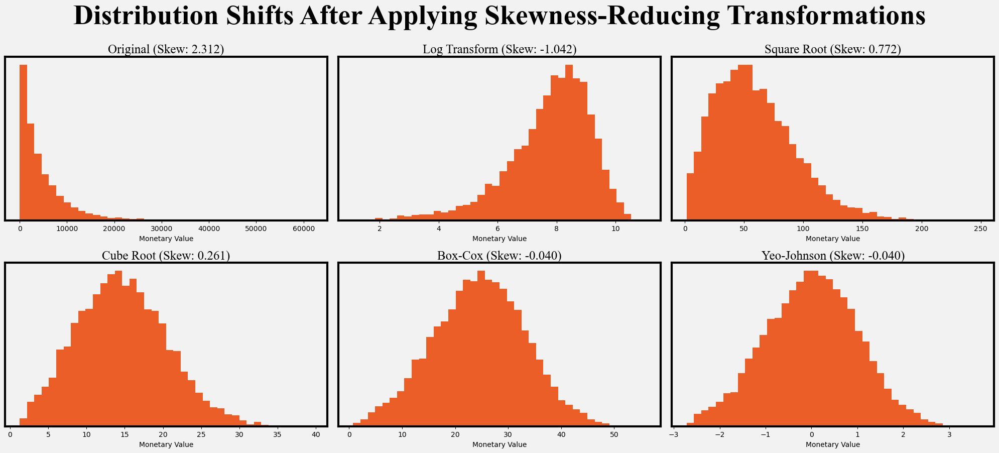

In [31]:
fig, axes = plt.subplots(2, 3, figsize=(20, 9))
fig.suptitle("Distribution Shifts After Applying Skewness-Reducing Transformations",y=0.97, x=0.5,ha="center",va="center",font=fonts[2],fontweight="bold",color="black",fontsize=40)
axes = axes.flatten()
transformations = {
    'Original': df['Monetary1'],'Log Transform': df['Monetary_log'],'Square Root': df['Monetary_sqrt'],
    'Cube Root': df['Monetary_cbrt'],'Box-Cox': boxcox_data,'Yeo-Johnson': yeojohnson_data.flatten()}
title_font = {'fontname': 'Times New Roman', 'fontweight': 'regular', 'fontsize': 18}
for i, (name, data) in enumerate(transformations.items()):
    skew_val = pd.Series(data).skew()
    axes[i].hist(data, bins=40, color='#eb5e28');axes[i].set_title(f"{name} (Skew: {skew_val:.3f})", **title_font)
    axes[i].set_xlabel("Monetary Value");axes[i].set_ylabel("");axes[i].set_yticks([]);axes[i].set_facecolor(facecolor)
    for spine in axes[i].spines.values():
        spine.set_color("#000000");spine.set_linewidth(3)
fig.patch.set_facecolor(facecolor)
plt.tight_layout()
plt.show()


In [32]:
pt = PowerTransformer(method='yeo-johnson')
rfm_table['Monetary'] = pt.fit_transform(rfm_table[['Monetary1']])
rfm_table['Monetary'].skew()

np.float64(-0.040279922425177236)

In [33]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_rfm_array = scaler.fit_transform(rfm_table[['Recency', 'Frequency', 'Monetary']])
scaled_rfm = pd.DataFrame(scaled_rfm_array, columns=['Recency', 'Frequency', 'Monetary'],index=rfm_table.index)
print("The shape of the scaled rfm dataset:",scaled_rfm.shape)
scaled_rfm.head()

The shape of the scaled rfm dataset: (11887, 3)


,Recency,Frequency,Monetary
0,-0.362253,-0.872979,-1.074764
1,-0.495197,0.564392,0.599528
2,-0.421340,-0.154293,-0.797965
3,1.151833,-0.872979,-0.692642
4,1.341401,-0.872979,-0.113970


In [34]:
k_values = range(2,6)
inertia = []
silhouette = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(scaled_rfm)
    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(scaled_rfm, kmeans.labels_))

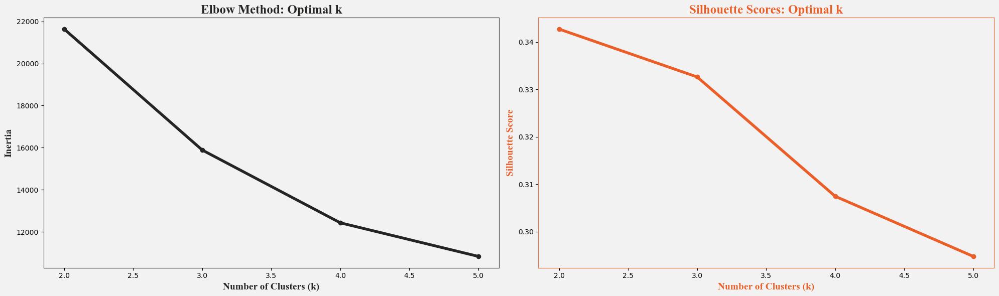

In [35]:
fig, axes = plt.subplots(1, 2, figsize=(20, 6), dpi=100, facecolor=facecolor)

# Elbow Method
axes[0].plot(k_values, inertia, 'o-', linewidth=4, color=blue)
axes[0].set_title('Elbow Method: Optimal k', fontname='Times New Roman', fontsize=18, fontweight='bold', color=blue)
axes[0].set_xlabel('Number of Clusters (k)', fontname='Times New Roman', fontsize=14, fontweight='bold', color=blue)
axes[0].set_ylabel('Inertia', fontname='Times New Roman', fontsize=14, fontweight='bold', color=blue)
axes[0].set_facecolor(facecolor)
for spine in axes[0].spines.values():
    spine.set_color(blue)

# Silhouette Scores
axes[1].plot(k_values, silhouette, 'o-', linewidth=4, color=green)
axes[1].set_title('Silhouette Scores: Optimal k', fontname='Times New Roman', fontsize=18, fontweight='bold', color=green)
axes[1].set_xlabel('Number of Clusters (k)', fontname='Times New Roman', fontsize=14, fontweight='bold', color=green)
axes[1].set_ylabel('Silhouette Score', fontname='Times New Roman', fontsize=14, fontweight='bold', color=green)
axes[1].set_facecolor(facecolor)
for spine in axes[1].spines.values():
    spine.set_color(green)

fig.patch.set_facecolor(facecolor)
plt.tight_layout()
plt.show()


In [36]:
kmeans_2 = KMeans(n_clusters=2, random_state=42, n_init=10)
scaled_rfm['2Clusters'] = kmeans_2.fit_predict(scaled_rfm)
scaled_rfm.head()

,Recency,Frequency,Monetary,2Clusters
0,-0.362253,-0.872979,-1.074764,1
1,-0.495197,0.564392,0.599528,0
2,-0.421340,-0.154293,-0.797965,1
3,1.151833,-0.872979,-0.692642,1
4,1.341401,-0.872979,-0.113970,1


In [37]:
cluster_colors = {"0": blue,"1": green}
fig = px.scatter_3d(scaled_rfm,x='Recency',y='Frequency',z='Monetary',color=scaled_rfm['2Clusters'].astype(str),color_discrete_map=cluster_colors)
fig.update_layout(
    title=dict(
        text="<b>3D RFM Cluster Visualization (2 Clusters)</b><br>"
             "<span style='font-size:14px;font-weight:normal;'>The clusters are well distinguished and visualized</span>",
        x=0.5,font=dict(family="Times New Roman", size=22, color=blue)),
    scene=dict(xaxis_title="<b>Recency</b>",yaxis_title="<b>Frequency</b>",zaxis_title="<b>Monetary</b>",
        xaxis_title_font=dict(family="Times New Roman", size=16, color=blue),yaxis_title_font=dict(family="Times New Roman", size=16, color=blue),
        zaxis_title_font=dict(family="Times New Roman", size=16, color=blue),bgcolor=facecolor),
    legend=dict(font=dict(family="Times New Roman", size=14, color=blue)),paper_bgcolor=facecolor,plot_bgcolor=facecolor,height=800)
fig.update_traces(marker=dict(size=3, showscale=False))
fig.show()


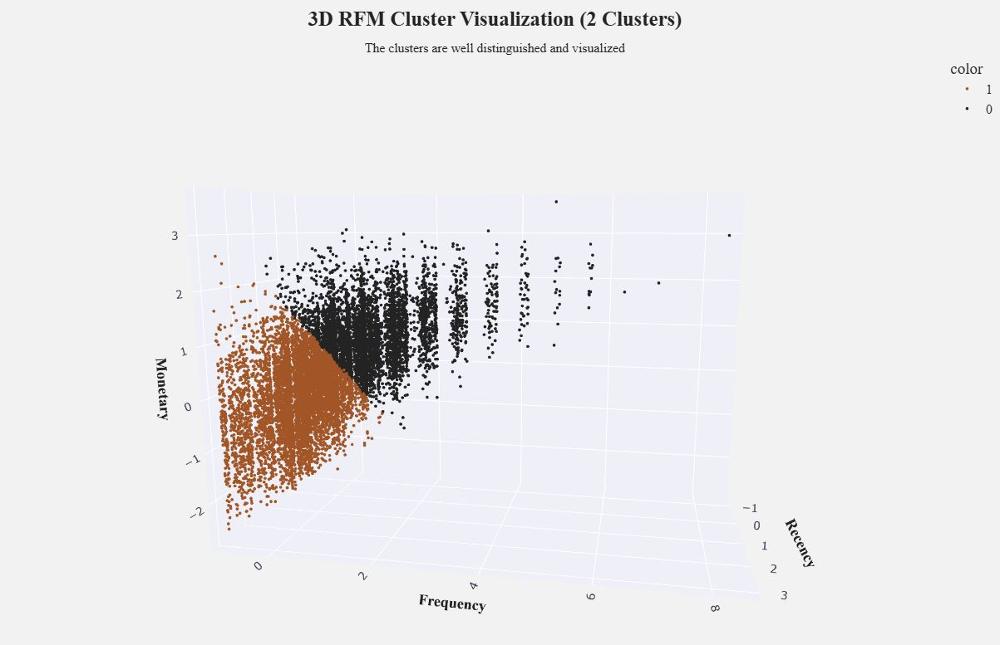

In [38]:
rfm_clusters = rfm_table.copy()
rfm_clusters['Cluster'] = scaled_rfm['2Clusters']
rfm_summary = (
    rfm_clusters.groupby('Cluster')
    .agg({'Recency': ['mean', 'median', 'count'],'Frequency': ['mean', 'median'],'Monetary1': ['mean', 'median', 'sum']}).round(2))
rfm_summary.columns = ['_'.join(col).strip() for col in rfm_summary.columns.values]
rfm_summary.reset_index(inplace=True)
total_revenue = rfm_summary['Monetary1_sum'].sum()
rfm_summary

,Cluster,Recency_mean,Recency_median,Recency_count,Frequency_mean,Frequency_median,Monetary1_mean,Monetary1_median,Monetary1_sum
0,0,389.07,390.0,5028,3.37,3.0,8287.17,6732.06,41667883.04
1,1,779.14,723.0,6859,1.37,1.0,2053.88,1413.90,14087596.55


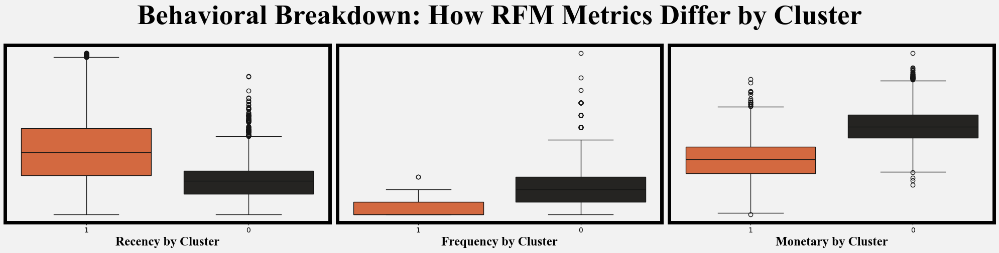

In [39]:
scaled_rfm['2Clusters'] = scaled_rfm['2Clusters'].astype(str)
categories = sorted(scaled_rfm['2Clusters'].unique())  # ['0','1']
palette_dict = {c: cluster_colors[c] for c in categories}
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
fig.suptitle("Behavioral Breakdown: How RFM Metrics Differ by Cluster",
             y=1, x=0.5,font=fonts[2],fontweight="bold",color="black",fontsize=40)
fig.patch.set_facecolor(facecolor)
for ax in axes:
    ax.set_facecolor(facecolor)
    for spine in ax.spines.values():
        spine.set_color("black");spine.set_linewidth(5)
sns.boxplot(x="2Clusters", y="Recency", data=scaled_rfm, ax=axes[0], palette=palette_dict)
axes[0].set_xlabel("Recency by Cluster",fontsize=18, fontweight='bold', fontname=fonts[2],color="black")
axes[0].set_yticks([]);axes[0].set_ylabel('')
sns.boxplot(x="2Clusters", y="Frequency", data=scaled_rfm, ax=axes[1], palette=palette_dict)
axes[1].set_xlabel("Frequency by Cluster",fontsize=18, fontweight='bold', fontname=fonts[2],color="black")
axes[1].set_yticks([]);axes[1].set_ylabel('')
sns.boxplot(x="2Clusters", y="Monetary", data=scaled_rfm, ax=axes[2], palette=palette_dict)
axes[2].set_xlabel("Monetary by Cluster",fontsize=18, fontweight='bold', fontname=fonts[2],color="black")
axes[2].set_yticks([]);axes[2].set_ylabel('')
plt.tight_layout()
plt.show()


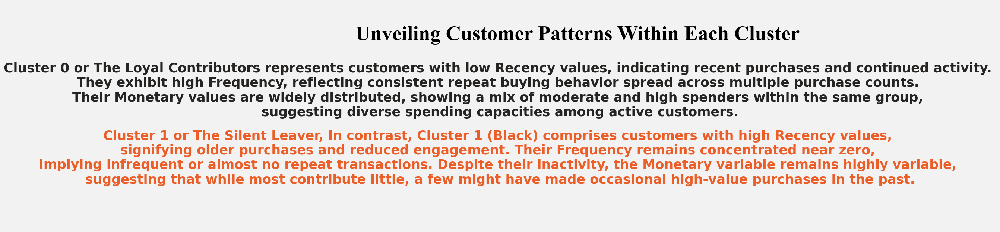

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(20, 7), facecolor=facecolor)

fig.suptitle("Unveiling Customer Patterns Within Each Cluster",
             y=0.8, x=0.5, font=fonts[2], fontweight="bold", color="black", fontsize=40)
ax.set_facecolor(facecolor)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel("")
ax.set_ylabel("")
for spine in ax.spines.values():
    spine.set_visible(False);spine.set_linewidth(5)
ax.text(0.8,0.5,"Cluster 0 or The Loyal Contributors represents customers with low Recency values, indicating recent purchases and continued activity. \nThey exhibit high Frequency, reflecting consistent repeat buying behavior spread across multiple purchase counts. \nTheir Monetary values are widely distributed, showing a mix of moderate and high spenders within the same group, \nsuggesting diverse spending capacities among active customers.",
        color=blue, fontsize=25, fontweight="bold", ha='center')
ax.text(0.8,0.2,"Cluster 1 or The Silent Leaver, In contrast, Cluster 1 (Black) comprises customers with high Recency values, \nsignifying older purchases and reduced engagement. Their Frequency remains concentrated near zero, \nimplying infrequent or almost no repeat transactions. Despite their inactivity, the Monetary variable remains highly variable, \nsuggesting that while most contribute little, a few might have made occasional high-value purchases in the past.",
        color=green, fontsize=25, fontweight="bold", ha='center')
plt.tight_layout()
plt.show()


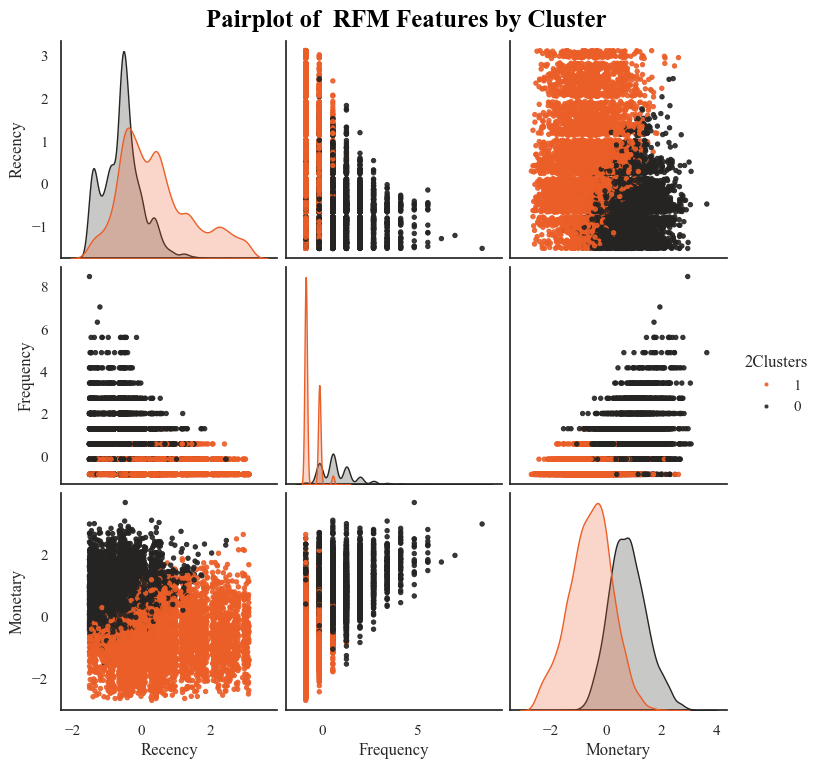

In [41]:
scaled_rfm['2Clusters'] = scaled_rfm['2Clusters'].astype(str)
cluster_colors = {"0": blue, "1": green}
sns.set(style="white", font="Times New Roman")
pair = sns.pairplot(data=scaled_rfm,vars=['Recency', 'Frequency', 'Monetary'],hue='2Clusters',palette=cluster_colors,diag_kind='kde',plot_kws={'alpha':0.9, 's': 10})
for ax in pair.axes.flatten():
    if ax is not None:
        for path_collection in ax.collections:
            face_color = path_collection.get_facecolor()
            if len(face_color) > 0:
                path_collection.set_edgecolor(face_color)
                path_collection.set_linewidth(0.7)

pair.fig.suptitle("Pairplot of  RFM Features by Cluster",fontsize=18,fontweight='bold',fontname="Times New Roman",y=1.02,color="black")
plt.show()


<h1 style="
  font-family: 'Americana XBdCn BT';
  text-shadow: 2px 2px 4px rgba(0,0,0,0.2);
  font-size: 60px;
  font-style: normal;
  background: linear-gradient(to right, #252422, #252422);
  letter-spacing: 0px;
  color: #eb5e28;
  border-radius: 40px;
  text-align: center;
  line-height: 1;
  padding: 10px 5px;
">
  <span>Recommendations:</span><br>
</h1>


<h1 style="
  font-family: 'Americana XBdCn BT';
  text-shadow: 2px 2px 4px rgba(0,0,0,0.2);
  font-size: 60px;
  font-style: normal;
  background: linear-gradient(to right, #252422, #252422);
  letter-spacing: 0px;
  color: #eb5e28;
  border-radius: 25px;
  text-align: left;
  line-height: 1;
  padding: 10px 10px;
">
  A. Retention and Loyalty Programs
</h1>

<p style="
  font-family: 'Americana XBdCn BT';
  font-size: 15px;
  color: #eb5e28;
  text-align: left;
  line-height: 1.8;
  margin-top: 15px;
">
ScalerMart’s top customers (Cluster 0) contribute the majority of total revenue, making them the foundation of business stability. 
To retain them, ScalerMart should introduce exclusive benefits like early access to launches, VIP discounts, and loyalty points that encourage repeat spending. 
Monitoring recency trends among this group is crucial—any increase in inactivity should immediately trigger targeted re-engagement campaigns. 
Proactive recognition programs, such as anniversary rewards or milestone badges, will reinforce emotional loyalty and sustain long-term relationships.
</p>

<p style="
  font-family: 'Americana XBdCn BT';
  font-size: 15px;
  color: #eb5e28;
  text-align: left;
  line-height: 1.8;
  margin-top: 10px;
">
Beyond transactional incentives, loyalty programs must be <b>personalized</b> to reflect purchase behavior and preferences. 
For example, a camera buyer could receive exclusive deals on lenses or accessories rather than generic discounts. 
Incorporating dynamic reward tiers ensures that spending more leads to proportionally greater benefits. 
By continuously rewarding loyalty through both tangible incentives and personalized recognition, 
ScalerMart can transform its best customers into brand advocates who sustain consistent revenue streams.
</p>


<h1 style="
  font-family: 'Americana XBdCn BT';
  text-shadow: 2px 2px 4px rgba(0,0,0,0.2);
  font-size: 60px;
  font-style: normal;
  background: linear-gradient(to right, #252422, #252422);
  letter-spacing: 0px;
  color: #eb5e28;
  border-radius: 25px;
  text-align: left;
  line-height: 1;
  padding: 10px 10px;
">
  B. Reactivation Campaigns for Dormant Customers
</h1>

<p style="
  font-family: 'Americana XBdCn BT';
  font-size: 15px;
  color: #eb5e28;
  text-align: left;
  line-height: 1.8;
  margin-top: 15px;
">
Cluster 1 customers, characterized by high recency and low purchase frequency, represent dormant or at-risk users. 
ScalerMart should implement win-back campaigns such as reminder emails, limited-time offers, or personalized discounts to re-engage them. 
Understanding why these customers have lapsed—whether due to price sensitivity, alternative options, or changing preferences—is critical for crafting effective messaging. 
Targeted outreach emphasizing value, convenience, and urgency can convert dormant users into active buyers again.
</p>

<p style="
  font-family: 'Americana XBdCn BT';
  font-size: 15px;
  color: #eb5e28;
  text-align: left;
  line-height: 1.8;
  margin-top: 10px;
">
Personalization drives results: leveraging previous purchase history allows for tailored recommendations or exclusive offers that resonate with individual users. 
Tracking the response and retention of reactivated customers helps assess campaign effectiveness and optimize future efforts. 
By consistently applying personalized and timely re-engagement strategies, ScalerMart can reduce churn, recover lost revenue, and gradually increase the active customer base.
</p>


<h1 style="
  font-family: 'Americana XBdCn BT';
  text-shadow: 2px 2px 4px rgba(0,0,0,0.2);
  font-size: 60px;
  font-style: normal;
  background: linear-gradient(to right, #252422, #252422);
  letter-spacing: 0px;
  color: #eb5e28;
  border-radius: 25px;
  text-align: left;
  line-height: 1;
  padding: 10px 10px;
">
  C. Frequency Boosting Strategies
</h1>

<p style="
  font-family: 'Americana XBdCn BT';
  font-size: 15px;
  color: #eb5e28;
  text-align: left;
  line-height: 1.8;
  margin-top: 15px;
">
Moderate-frequency customers are poised to become loyal contributors if encouraged to purchase more often. 
ScalerMart can use bundle offers, subscription plans, or cross-selling strategies to increase transaction frequency. 
Identifying these customers through RFM segmentation ensures that outreach is focused on those with the highest potential for incremental purchases. 
By providing compelling reasons to engage repeatedly, the company strengthens habits and builds long-term revenue growth.
</p>

<p style="
  font-family: 'Americana XBdCn BT';
  font-size: 15px;
  color: #eb5e28;
  text-align: left;
  line-height: 1.8;
  margin-top: 10px;
">
Personalized frequency campaigns should leverage prior purchase patterns to recommend relevant add-ons or complementary products. 
Offering time-sensitive incentives or loyalty points for repeat purchases can further accelerate buying behavior. 
Monitoring shifts in frequency over time allows ScalerMart to measure campaign effectiveness and refine strategies, 
ensuring that moderately active customers move toward becoming highly engaged, repeat buyers.
</p>
